In [1]:
matplotlib widget

In [2]:
# --- Import all packge used ---

import numpy as np 
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

# --- Try to import Pytorch to use gpu acceleration --- 
try: 
    import torch
    # Check for Metal Performance Shaders (MPS) availability (Apple Silicon)
    if torch.backends.mps.is_available():
        device = torch.device("mps")
        print(f"PyTorch imported. Using Apple Metal (MPS) on {device}.")
    # If not on Apple Silicon, check for CUDA availability (NVidia gpu)
    elif torch.cuda.is_available():
        device = torch.device("cuda")
        print(f"PyTorch imported. Using CUDA on {device}.")
    # If none of above is available, just use CPU
    else: 
        device = torch.device("cpu")
        print(f"PyTorch imported. Warning: MPS/CUDA not found, running on CPU {device}.")
except ImportError:
    print("Error: PyTorch module not found.")
    print("Please install PyTorch: 'pip install torch'")
    exit()

# --- Try to import xraylib ---
try: 
    import xraylib
except ImportError:
    print("Error: xraylib module not found.")
    print("Please ensure xraylib is installed ('pip install xraylib')")
    exit()

PyTorch imported. Using CUDA on cuda.


In [3]:
# --- Helper constants ---
HC_EV_NM = 1239.84            # eV * nm
HC_CM_KEV = 12.3984e-8        # cm * keV

# Initialize xraylib
try: 
    xraylib.XRayInit()
except AttributeError:
    pass

def get_complex_transmission(material_str: str, density_g_cm3: float, thickness_nm: float, energy_ev: float) -> complex:
    """ Calculates complex transmission (Amplitude * exp(i*Phase)). """
    try:
        energy_kev = energy_ev / 1000.0
        lambda_nm = HC_EV_NM /energy_ev
        lambda_cm = lambda_nm * 1e-7
        thickness_cm = thickness_nm * 1e-7

        delta = 1.0 - xraylib.Refractive_Index_Re(material_str, energy_kev, density_g_cm3)
        beta = xraylib.Refractive_Index_Im(material_str, energy_kev, density_g_cm3)

        phase = (2 * np.pi * delta/lambda_cm) * thickness_cm
        atten_amplitude = np.exp(- (2 * np.pi * beta / lambda_cm) * thickness_cm)

        return atten_amplitude * np.exp(1j * phase)
    except Exception as e:
        print(f"Error in get_conmplex_transmission: {e}")
        return 0.0 + 0.0j

In [4]:
# --- Parameters ---

energy = 1000                                 # Energy level [eV]
lambda0 = HC_EV_NM / energy                   # central wavelength [nm]
rel_fwhm = 0.02                               # relative FWHM
fwhm = rel_fwhm * lambda0                     # absolute FWHM [nm]
sigma_lambda = fwhm / (2 * np.sqrt(2 * np.log(2)))

d = 8000.0                                    # grating pitch [nm]
duty = 0.5                                    # duty cycle
Lx = d * 50                                   # transverse window size
N = 2048                                      # Grid size (N x N)

# --- Source Configuration --- 
dist_source_grating_m = 0.1                  # Distance from Point Source to Grating [m]

# --- Wedge Configuration ---
use_wedge = True
wedge_material = "Si"
wedge_rho = xraylib.ElementDensity(14)
wedge_base_length_um = Lx/4*1e-3                      # Length of the wedge base in microns
wedge_base_width_um = Lx/4*1e-3                   # Width of the wedge base in microns
wedge_height_um = 10.0                        # Max thickness of the wedge in microns
wedge_center_x_um = 0.0                       # Center position X in microns
wedge_center_y_um = 0.0                       # Center position Y in microns
wedge_angle_deg = 0.0                         # Rotation angle in degrees (0 = slope along X)

# --- Grating Material Parameters ---
mat_grat = "Si"
rho_grat = xraylib.ElementDensity(14)
t_grat_nm = 680.0

mat_sub = "Si"
rho_sub = xraylib.ElementDensity(14)
t_sub_nm = 2000.0 - t_grat_nm

# --- Propagation coordinates ---
zT = 2 * d**2/ lambda0                         # Talbot length [nm]
z_max =3* zT/16                          # propagate distance
nz = 2000                                      # number of z samples

# Spectral sampling
n_lambda = 1                                  # number of wavelengh samples
lam_samples = np.linspace(lambda0 - 3* sigma_lambda, lambda0 + 3* sigma_lambda, n_lambda)
if n_lambda > 1:
    weights = np.exp(-0.5 * ((lam_samples - lambda0)/sigma_lambda)**2)
    weights /= np.sum(weights)
else: 
    weights = np.array([1.0])

# --- 2D Grid Setup (PyTorch / GPU) ---
N_pad = N 
N_total = N + 2 * N_pad
L_total = Lx * (N_total / N)

print(f"Allocating Memory on {device} for Grid: {N_total}x{N_total} pixels...")

# Create grid directly on Device
x_t = torch.linspace(-L_total/2, L_total/2, N_total, device = device)
y_t = torch.linspace(-L_total/2, L_total/2, N_total, device = device)
dx = (x_t[1] - x_t[0]).item()
dy = (y_t[1] - y_t[0]).item()

X_t, Y_t = torch.meshgrid(x_t, y_t, indexing='xy')


use_spherical = False
# Pre-calculate squared radius for spherical phase (on GPU)
R2_t = X_t**2 + Y_t**2

# 2D Frequency grid
fx_t = torch.fft.fftfreq(N_total, d = dx).to(device)
fy_t = torch.fft.fftfreq(N_total, d = dy).to(device)
FX_t, FY_t = torch.meshgrid(fx_t, fy_t, indexing='xy')
F2_t = FX_t**2 + FY_t**2

# Prepare z axis (CPU)
z = np.linspace(0, z_max, nz)

use_absorbing_boundaries = True

# --- Absorbing Boundary Mask ---
if use_absorbing_boundaries:
    absorber_mask_t = torch.zeros((N_total, N_total), dtype=torch.float32, device=device)

    zero_mask = (X_t > -L_total/2) & (X_t < L_total/2) & (Y_t > -L_total/2) & (Y_t < L_total/2)
    absorber_mask_t[zero_mask] = 1.0
else:
    print("Using Periodic Boundaries (No Absorption)")
    absorber_mask_t = None

Allocating Memory on cuda for Grid: 6144x6144 pixels...


In [5]:
# --- Function: 2D Fresnel Propagation (PyTorch) --- 
def fresnel_propagate_2d_torch(U0_t, lam_nm, z_dist_nm, F2_t, absorber_mask_t=None):
    """2D Fresnel propagation step on Torch Device."""
    phase = -1j * np.pi * lam_nm * z_dist_nm * F2_t   # Ensure -1j is handled as complex
    H_t = torch.exp(phase)

    # FFT -> Multiply -> IFFT
    U0_f_t = torch.fft.fft2(U0_t)
    Uz_t = torch.fft.ifft2(U0_f_t * H_t)

    if absorber_mask_t is not None:
        Uz_t *= absorber_mask_t
    
    return Uz_t

def get_wedge_transmission_torch(X_t, Y_t, mat_str, rho, length_um, width_um, height_um, center_x_um, center_y_um, angle_deg, en_ev):
    """Calculates complex transmission of a wedge."""
    # Convert parameters
    length_nm = length_um * 1000.0
    width_nm = width_um * 1000.0
    height_nm = height_um * 1000.0
    center_x_nm = center_x_um * 1000.0
    center_y_nm = center_y_um * 1000.0
    angle_rad = angle_deg * np.pi / 180.0

    # 1. Coordinate Transform (Shift & Rotate)
    # Shift
    X_shift = X_t - center_x_nm
    Y_shift = Y_t - center_y_nm

    # Rotate (Standard 2D rotation matrix)
    # X' is along the slope, Y' is along the length
    X_rot = X_shift * np.cos(angle_rad) + Y_shift * np.sin(angle_rad)
    Y_rot = -X_shift * np.sin(angle_rad) + Y_shift * np.cos(angle_rad)

    # 2. Define Wedge Thickness Profile t(x,y)
    # Linear ramp from -width/2 to +width/2
    # Assume a single slope (prism): 0 at -w/2, h at +w/2

    # Profile along X_rot
    # Normalized coordinate u from 0 to 1 across the width
    u = (X_rot + width_nm/2.0) /width_nm

    # Create mask for the wedge area
    wedge_mask = (u >= 0.0) & (u <= 1.0) & (Y_rot >= -length_nm/2) & (Y_rot < length_nm/2)

    #Thickness map (initialize to 0)
    thickness_map_nm = torch.zeros_like(X_t)
    thickness_map_nm[wedge_mask] = u[wedge_mask] * height_nm  # Apply linear ramp inside the mask

    # 3. Calculate Transmission
    # Get optical constants (scalar)
    energy_kev = en_ev / 1000.0
    lam_nm = HC_EV_NM / en_ev
    lam_cm = lam_nm * 1e-7

    delta = 1.0 - xraylib.Refractive_Index_Re(mat_str, energy_kev, rho)
    beta = xraylib.Refractive_Index_Im(mat_str, energy_kev, rho)

    # Convert thickness map to cm for physics calc
    t_cm = thickness_map_nm * 1e-7

    # Phase shift
    phi = (2 * np.pi * delta / lam_cm) * t_cm

    # Attenuation 
    atten = torch.exp(-(2 * np.pi * beta / lam_cm) * t_cm)

    # Complex transmission
    return atten * torch.exp(1j * phi)

In [6]:
# --- Simulation Storage ---

slice_idx = N_total // 2
# Initialize storage on GPU
intensity_carpet_slice_t = torch.zeros((nz, N_total), dtype=torch.float32, device=device)
final_intensity_2d_t = torch.zeros((N_total, N_total), dtype=torch.float32, device=device)

print("Starting 2D simulation...")
print(f"Energy: {energy} eV")
print(f"Source Distance: {dist_source_grating_m} m")
if use_wedge:
    print(f"Adding {wedge_material} Wedge: W={wedge_base_width_um}um, H={wedge_height_um}um")

z_source_nm = dist_source_grating_m * 1e9


# Sweep the spectrum of the source
for i in range(n_lambda):
    lam_nm = lam_samples[i]
    en_ev = HC_EV_NM / lam_nm
    weight = weights[i]

    print(f" Calculating lambda {i+1}/{n_lambda} ({lam_nm:.4f} nm)..." )

    # --- 1. Grating Transmission ---
    tau_valley = get_complex_transmission(mat_sub, rho_sub, t_sub_nm, en_ev)
    tau_grat_material = get_complex_transmission(mat_grat, rho_grat, t_grat_nm, en_ev)
    tau_peak = tau_valley * tau_grat_material

    # --- 2. Checkerboard Mask
    square_size = d * duty
    
    # 1. Calculate floor indices for the entire grid (vectorized)
    #    It is computationally cheaper to just calculate this everywhere first.
    idx_x_t = torch.floor(X_t / square_size)
    idx_y_t = torch.floor(Y_t / square_size)

    # 2. Calculate the checkerboard pattern (0s and 1s)
    grating_mask_2d_t = torch.remainder(idx_x_t + idx_y_t, 2)

    # 3. Create a boolean mask for the "valid" center region
    #    We define where we WANT the pattern to keep, rather than what to remove.
    #    Condition: -Lx/2 <= x < Lx/2  AND  -Lx/2 <= y < Lx/2
    valid_region = (X_t >= -Lx/2) & (X_t < Lx/2) & (Y_t >= -Lx/2) & (Y_t < Lx/2)

    # 4. Apply the mask
    #    The '~' operator inverts the boolean mask (selects everything OUTSIDE the region).
    grating_mask_2d_t[~valid_region] = 0

    # --- 3. Initial Fields ---


    U_transmission_t = torch.ones_like(X_t, dtype=torch.complex64)
    
    # A.Spherical Phase
    

    if use_spherical:
        spherical_phase_t = torch.exp(1j * np.pi * R2_t / (lam_nm * z_source_nm))
        U0_2d_t = U_transmission_t * spherical_phase_t
    else:
        U0_2d_t = U_transmission_t
    
    # C. Wedge Field
    if use_wedge:
        wedge_trans_t = get_wedge_transmission_torch(
            X_t, Y_t,
            wedge_material, wedge_rho,
            wedge_base_length_um, wedge_base_width_um, wedge_height_um,
            wedge_center_x_um, wedge_center_y_um,
            wedge_angle_deg, en_ev
        )
        U_current_t = U0_2d_t * wedge_trans_t # Combine: U = Grating * Wedge * Spherical_Source
    else:
        U_current_t = U0_2d_t

    # B. Grating Field

    G_transmission_t = torch.ones_like(X_t, dtype=torch.complex64) * tau_valley
    G_transmission_t[grating_mask_2d_t == 1] = tau_peak

    U_current_t = U_current_t*G_transmission_t
    
    intensity_carpet_slice_t[0, :] += (torch.abs(U_current_t[slice_idx, :])**2) * weight

    # Propagate
    for j in tqdm(range(1, nz)):
        z_dist = z[j] - z[j-1]
        U_current_t = fresnel_propagate_2d_torch(U_current_t, lam_nm, z_dist, F2_t,absorber_mask_t)
        intensity_carpet_slice_t[j, :] += (torch.abs(U_current_t[slice_idx,:])**2) * weight
    
    final_intensity_2d_t += (torch.abs(U_current_t)**2) * weight    
    

Starting 2D simulation...
Energy: 1000 eV
Source Distance: 0.1 m
Adding Si Wedge: W=100.0um, H=10.0um
 Calculating lambda 1/1 (1.2082 nm)...


100%|██████████| 1999/1999 [00:09<00:00, 202.10it/s]


In [7]:
# --- Transfer to CPU ---
intensity_carpet_slice = intensity_carpet_slice_t.cpu().numpy()
final_intensity_2d = final_intensity_2d_t.cpu().numpy()
x_cpu = x_t.cpu().numpy()

Plots saved.


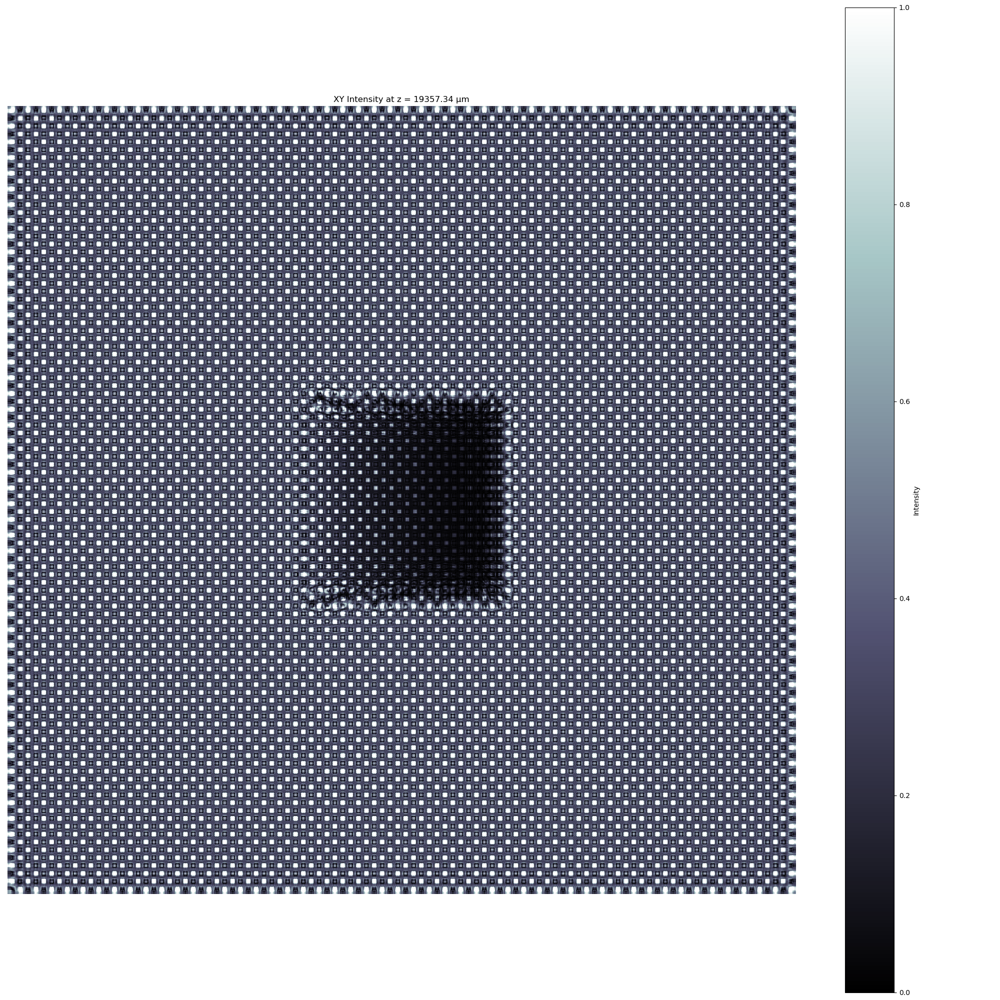

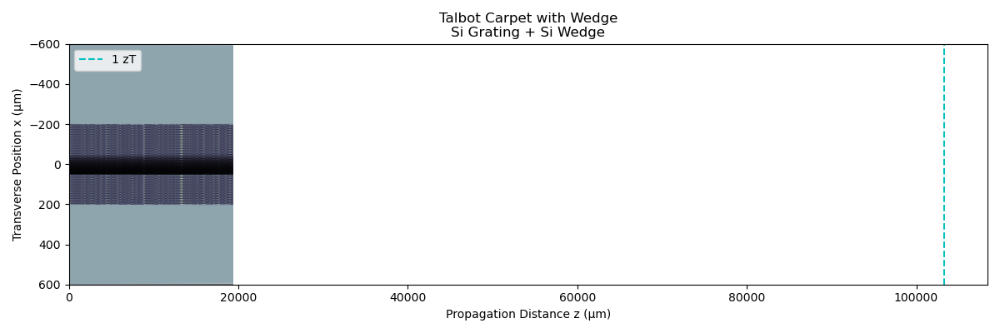

In [8]:
# --- Plotting ---
x_padded = x_cpu
# crop_mask_1d = (x_padded > - Lx/2) & (x_padded < Lx/2)
x_crop = x_padded#[crop_mask_1d] # Plot full padded area or crop as needed

intensity_slice = intensity_carpet_slice.transpose()

x_plot_um = x_crop * 1e-3
z_plot_um = z * 1e-3

filename = "talbot_2d"

plt.figure(figsize=(12, 4))
plt.imshow(
    intensity_slice,
    extent=[z_plot_um.min(), z_plot_um.max(), x_plot_um.max(), x_plot_um.min()],
    aspect='auto',
    cmap='bone'
)
plt.axis('on')
plt.xlabel("Propagation Distance z (µm)")
plt.ylabel("Transverse Position x (µm)")
plt.clim(0,1)
if use_wedge:
    plt.title(f"Talbot Carpet with Wedge\n{mat_grat} Grating + {wedge_material} Wedge")
else:
    plt.title(f"Talbot Carpet\n{mat_grat} Gratin")
plt.axvline(zT * 1e-3, color='c',  linestyle='--', label=f"1 zT")
plt.legend()
plt.tight_layout()
if use_spherical:
    filename+= "_spherical"
else:
    filename+= "_plane"

if use_wedge:
        filename+="_wedge"


plt.savefig(filename + "_carpet.png")

plt.figure(figsize=(20, 20),dpi = 100, frameon=False)
plt.imshow(
    final_intensity_2d,
    extent=[x_plot_um.min(), x_plot_um.max(), x_plot_um.min(), x_plot_um.max()],
    origin='lower',
    cmap='bone'
)
plt.xlim(-Lx/2*1e-3 - 2*dx * 1e-3,Lx/2*1e-3 + 2*dx * 1e-3)
plt.ylim(-Lx/2*1e-3 - 2*dy * 1e-3,Lx/2*1e-3 + 2*dy * 1e-3)
plt.clim(0,1)
plt.axis('off')

plt.tight_layout()
plt.savefig(filename + "_pattern.tif", bbox_inches='tight', pad_inches=0)
plt.colorbar(label="Intensity")
plt.title(f"XY Intensity at z = {z_max/1000:.2f} µm")
plt.xlabel("x (µm)")
plt.ylabel("y (µm)")

plt.savefig(filename + "_pattern.png")


print("Plots saved.")
plt.show()